<a href="https://colab.research.google.com/github/gansarpamungkas/VoiceRecognitionWhisper-ASR-Minds14-English/blob/main/model.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Install Package

In [ ]:
!pip install transformers[torch]
!pip install accelerate -U
!pip install datasets[audio]
!pip install evaluate
!pip install jiwer

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 265.7/265.7 kB 8.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 507.1/507.1 kB 11.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 115.3/115.3 kB 18.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 21.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 84.1/84.1 kB 2.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.3/3.3 MB 14.2 MB/s eta 0:00:00


In [ ]:
!pip install rouge

In [ ]:
import numpy as np
import IPython.display as ipd
import torch
import transformers
import datasets
import librosa
import re
import json
import random
import matplotlib.pyplot as plt
import pandas as pd
import evaluate
import nltk
import librosa.display

from IPython.display import display as ipd
from IPython.display import HTML
from datasets import load_dataset, load_metric, ClassLabel, Audio
from transformers import WhisperConfig, WhisperProcessor, WhisperFeatureExtractor, WhisperTokenizer, WhisperForConditionalGeneration
from transformers import Trainer, TrainingArguments, DataCollatorWithPadding, DataCollator
from transformers import Seq2SeqTrainer, Seq2SeqTrainingArguments, Trainer, TrainingArguments
from transformers import pipeline
from transformers.utils import send_example_telemetry

from dataclasses import dataclass, field
from typing import Any, Dict, List, Optional, Union
from transformers import AdamW
from datasets import DatasetDict
from datasets import concatenate_datasets

# from rouge import Rouge

nltk.download('punkt')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


True

# Load Datasets

In [ ]:
# minds_enUS = load_dataset(
#     'PolyAI/minds14',
#     name='en-US',
# )

# minds_enAU = load_dataset(
#     'PolyAI/minds14',
#     name='en-AU',
# )

# minds_enGB = load_dataset(
#     'PolyAI/minds14',
#     name='en-GB',
# )

!huggingface-cli download PolyAI/minds14 --repo-type dataset --revision refs/convert/parquet --local-dir . --local-dir-use-symlinks False  --include 'en-US/*'
!huggingface-cli download PolyAI/minds14 --repo-type dataset --revision refs/convert/parquet --local-dir . --local-dir-use-symlinks False  --include 'en-AU/*'
!huggingface-cli download PolyAI/minds14 --repo-type dataset --revision refs/convert/parquet --local-dir . --local-dir-use-symlinks False  --include 'en-GB/*'

minds_enUS = load_dataset('./en-US', split="train")
minds_enAU = load_dataset('./en-AU', split="train")
minds_enGB = load_dataset('./en-GB', split="train")

Consider using `hf_transfer` for faster downloads. This solution comes with some limitations. See https://huggingface.co/docs/huggingface_hub/hf_transfer for more details.
Fetching 2 files:   0% 0/2 [00:00<?, ?it/s]downloading https://huggingface.co/datasets/PolyAI/minds14/resolve/706303078a01fcc31a36c2fc04fda5de3bdd70cf/en-US/train/index.duckdb to /root/.cache/huggingface/hub/tmp2rwb4q3u
downloading https://huggingface.co/datasets/PolyAI/minds14/resolve/706303078a01fcc31a36c2fc04fda5de3bdd70cf/en-US/train/0000.parquet to /root/.cache/huggingface/hub/tmpqhli50lx

index.duckdb:   0% 0.00/31.2M [00:00<?, ?B/s]

0000.parquet:   0% 0.00/34.2M [00:00<?, ?B/s]
index.duckdb:  34% 10.5M/31.2M [00:00<00:01, 18.4MB/s]

0000.parquet:  31% 10.5M/34.2M [00:00<00:01, 17.6MB/s]
index.duckdb:  67% 21.0M/31.2M [00:00<00:00, 30.6MB/s]

0000.parquet:  61% 21.0M/34.2M [00:00<00:00, 31.8MB/s]
index.duckdb: 100% 31.2M/31.2M [00:00<00:00, 34.4MB/s]


0000.parquet: 100% 34.2M/34.2M [00:00<00:00, 34.6MB/s]
Fet

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

In [ ]:
print(minds_enUS)
print(minds_enAU)
print(minds_enGB)

Dataset({
    features: ['path', 'audio', 'transcription', 'english_transcription', 'intent_class', 'lang_id'],
    num_rows: 563
})
Dataset({
    features: ['path', 'audio', 'transcription', 'english_transcription', 'intent_class', 'lang_id'],
    num_rows: 654
})
Dataset({
    features: ['path', 'audio', 'transcription', 'english_transcription', 'intent_class', 'lang_id'],
    num_rows: 592
})


## Merge the dataset

we can also merge the datasets since the english not very different so we can have more data for training.

In [ ]:
merged_dataset = concatenate_datasets([minds_enUS, minds_enAU, minds_enGB])

print(merged_dataset)


Dataset({
    features: ['path', 'audio', 'transcription', 'english_transcription', 'intent_class', 'lang_id'],
    num_rows: 1809
})


# Exploratory Datasets

Since this is dataset contain audio we should check the waveplot and the spectogram from the audio. We can check the waveplot and spectogram using matplotlib librosa, gradio etc.

### Check intent_class distribution

In this section we gonna check the ditributuion of intent_class column. The intent class columns have 14 different values.
- 0 = abroad
- 1= adress
- 2= app_error
- 3= atm_limit
- 4=balance
- 5= business_loan
- 6=card_issues
- 7= cash_deposite
- 8=direct_debit
- 9=freeze
- 10=latest_transactions
- 11=joint_account
- 12=high_value_payment
- 13=pay_bill

In [ ]:
intent_classes = [
    {'index': 0, 'name': 'abroad'},
    {'index': 1, 'name': 'adress'},
    {'index': 2, 'name': 'app_error'},
    {'index': 3, 'name': 'atm_limit'},
    {'index': 4, 'name': 'balance'},
    {'index': 5, 'name': 'business_loan'},
    {'index': 6, 'name': 'card_issues'},
    {'index': 7, 'name': 'cash_deposite'},
    {'index': 8, 'name': 'direct_debit'},
    {'index': 9, 'name': 'freeze'},
    {'index': 10, 'name': 'latest_transactions'},
    {'index': 11, 'name': 'joint_account'},
    {'index': 12, 'name': 'high_value_payment'},
    {'index': 13, 'name': 'pay_bill'}
]

def plot_label_distribution(dataset):
    # Extract intent_class labels
    labels = dataset['intent_class']

    # Count the frequency of each label
    label_counts = {}
    for label in labels:
        if label in label_counts:
            label_counts[label] += 1
        else:
            label_counts[label] = 1

    # Sort labels by their counts in descending order
    sorted_labels = sorted(label_counts.items(), key=lambda x: x[1], reverse=True)
    sorted_labels = [{'name': intent_classes[label[0]]['name'], 'index': intent_classes[label[0]]['index'], 'count': label[1]} for label in sorted_labels]

    # Create x-axis labels combining name and index
    x_labels = [f"{label['name']} ({label['index']})" for label in sorted_labels]
    counts = [label['count'] for label in sorted_labels]

    # Plot distribution
    plt.figure(figsize=(12, 6))
    plt.bar(x_labels, counts, color='skyblue')
    plt.xlabel('Intent Class')
    plt.ylabel('Frequency')
    plt.title('Distribution of Intent Classes')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

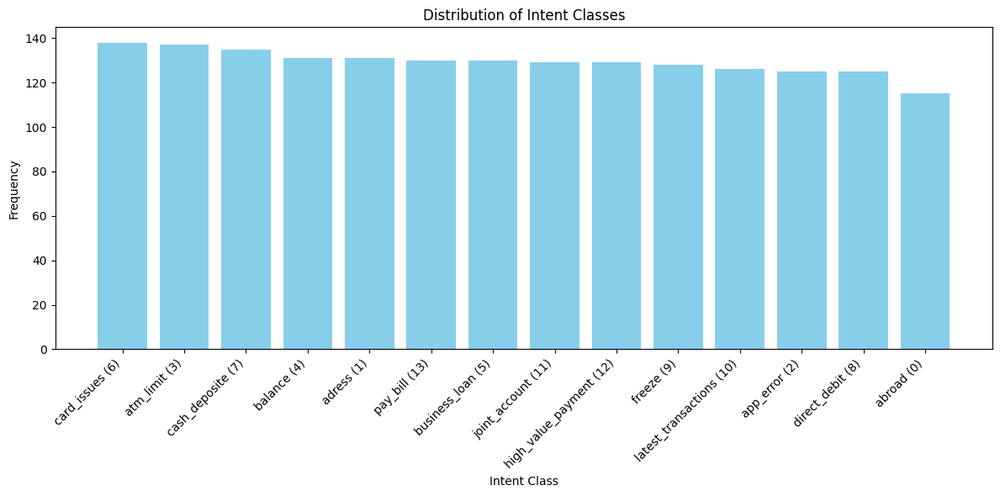

In [ ]:
plot_label_distribution(merged_dataset)

### Visualize Waveplot and Spectogram

Now we gonna visualize the waveplot and spectogram from intent_class label using librosa and matplotlib.

In [ ]:
import IPython.display as ipd
from IPython.core.display import display

def plot_waveform_and_spectrogram(dataset, intent_class, name_intent):
    # Filter dataset for a specific intent_class
    filtered_data = dataset.filter(lambda example: example['intent_class'] == intent_class)

    # Take the first audio sample for the given intent_class
    sample = filtered_data[0]

    # Extract audio array and sampling rate
    audio_array = sample['audio']['array']
    sr = sample['audio']['sampling_rate']

    # display(Audio(sample['audio']))
    ipd.Audio(data=np.asarray(sample['audio']['array']), rate=8000)

    print("transcription: ", sample['transcription'])

    # Plot Waveform
    plt.figure(figsize=(20, 8))

    plt.subplot(1, 2, 1)  # 1 row, 2 columns, 1st subplot
    librosa.display.waveshow(audio_array, sr=sr)
    plt.title(f'Waveform for intent_class: {intent_class} {name_intent}')
    plt.xlabel('Time')
    plt.ylabel('Amplitude')

    # Compute and plot Spectrogram
    plt.subplot(1, 2, 2)  # 1 row, 2 columns, 2nd subplot
    X = librosa.stft(audio_array)
    Xdb = librosa.amplitude_to_db(abs(X))
    librosa.display.specshow(Xdb, sr=sr, x_axis='time', y_axis='hz')
    plt.colorbar()
    plt.title(f'Spectrogram for intent_class: {intent_class} {name_intent}')

    plt.tight_layout()
    plt.show()


Filter:   0%|          | 0/1809 [00:00<?, ? examples/s]

transcription:  yes I'm going to be traveling to the United Kingdom for a couple of weeks next month I need to know if I can use my card from from my bank account while I'm in Europe


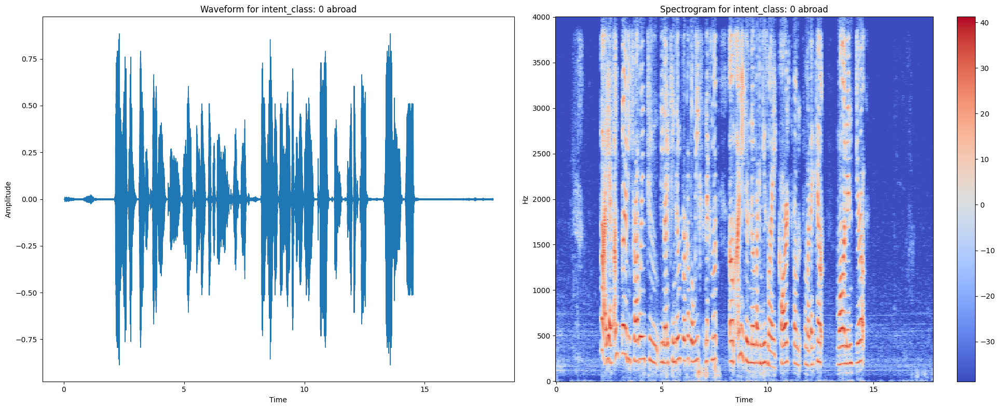

Filter:   0%|          | 0/1809 [00:00<?, ? examples/s]

transcription:  hi yes I like to change my address


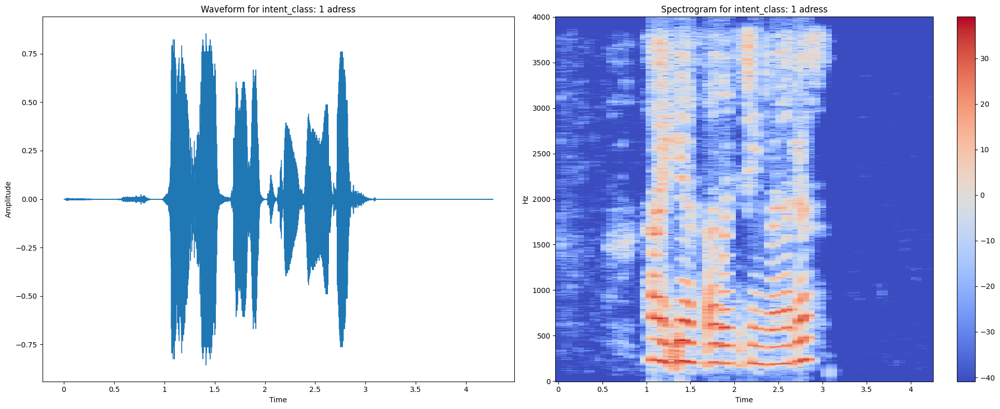

Filter:   0%|          | 0/1809 [00:00<?, ? examples/s]

transcription:  high on the app isn't loading information


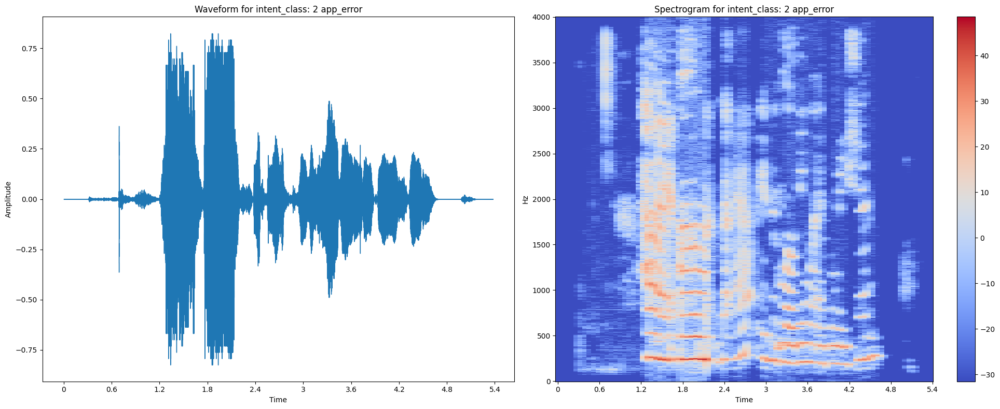

Filter:   0%|          | 0/1809 [00:00<?, ? examples/s]

transcription:  how much money can I withdraw per day from the ATM


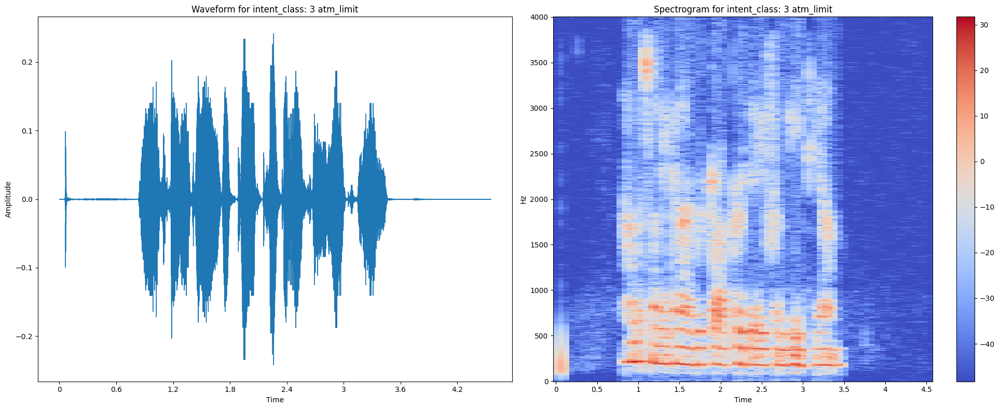

Filter:   0%|          | 0/1809 [00:00<?, ? examples/s]

transcription:  what is my account balance


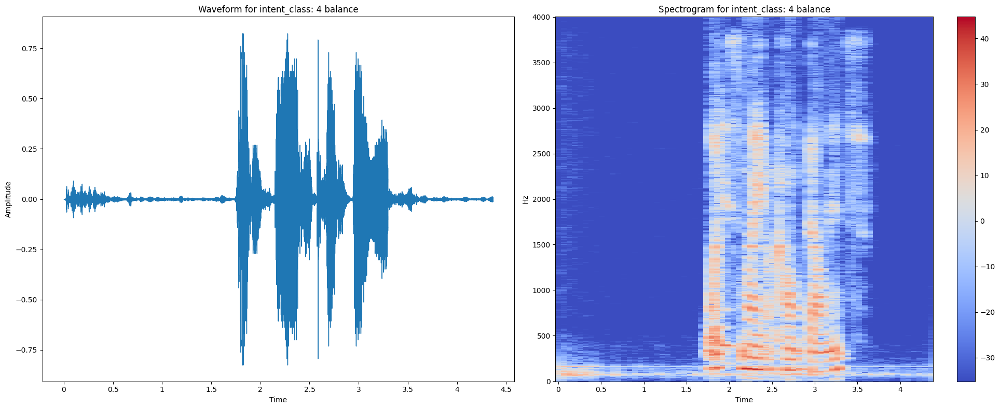

Filter:   0%|          | 0/1809 [00:00<?, ? examples/s]

transcription:  I'm calling to inquire about a business loan


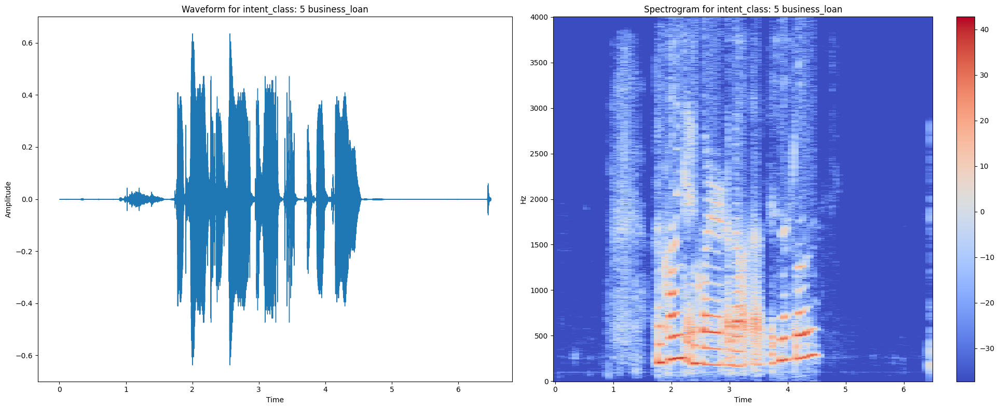

Filter:   0%|          | 0/1809 [00:00<?, ? examples/s]

transcription:  I'm trying to say something is my car doesn't seem to work whenever I called do it it doesn't actually work


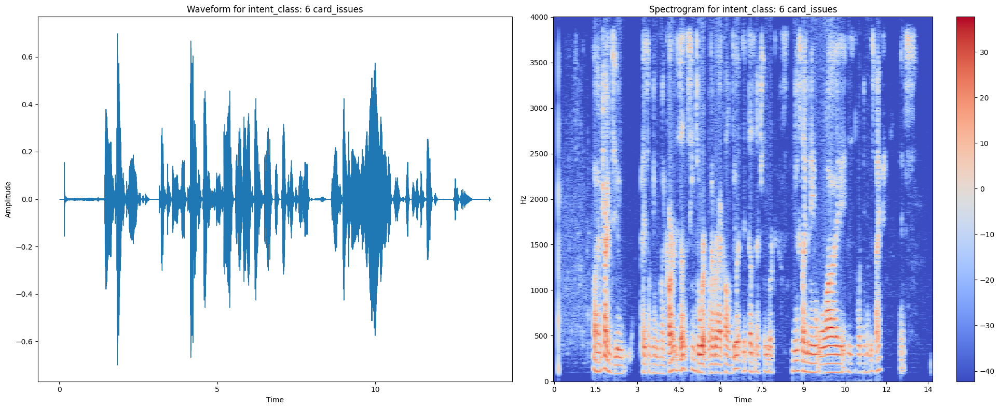

Filter:   0%|          | 0/1809 [00:00<?, ? examples/s]

transcription:  transfer money to the account


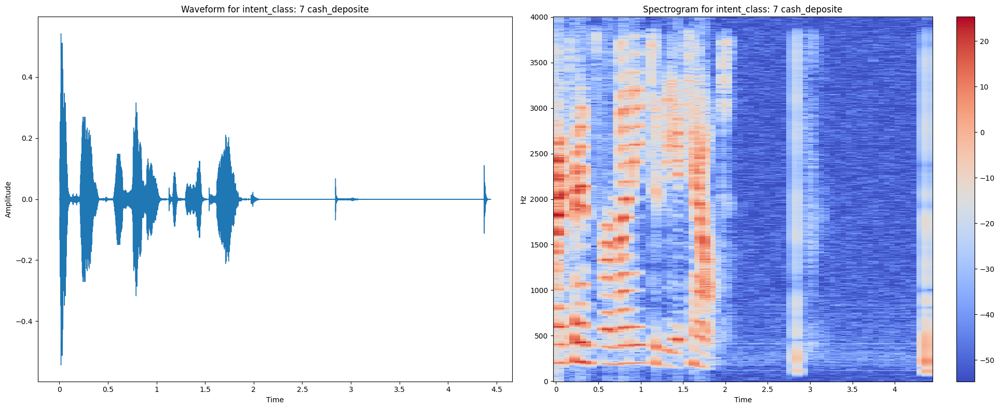

Filter:   0%|          | 0/1809 [00:00<?, ? examples/s]

transcription:  I'm having trouble understanding what a direct debit is to provide through Clarity and information for me


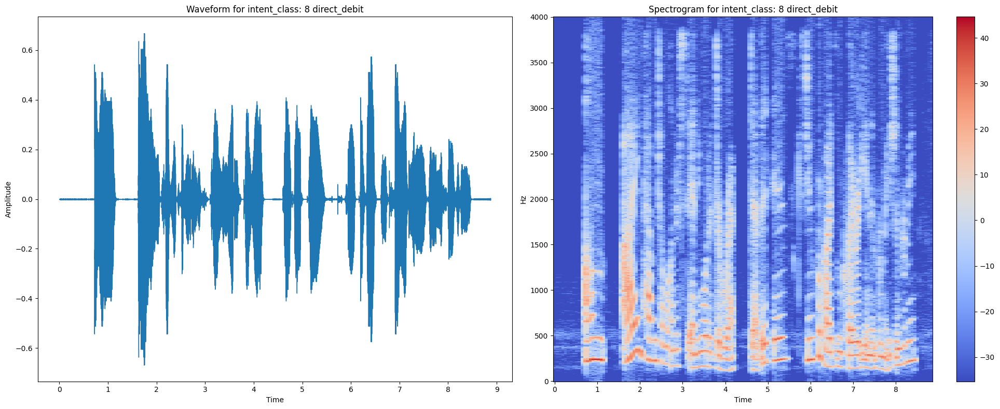

Filter:   0%|          | 0/1809 [00:00<?, ? examples/s]

transcription:  oh yeah hi I need fastest topical transactions on my card freeze my card block my card or something


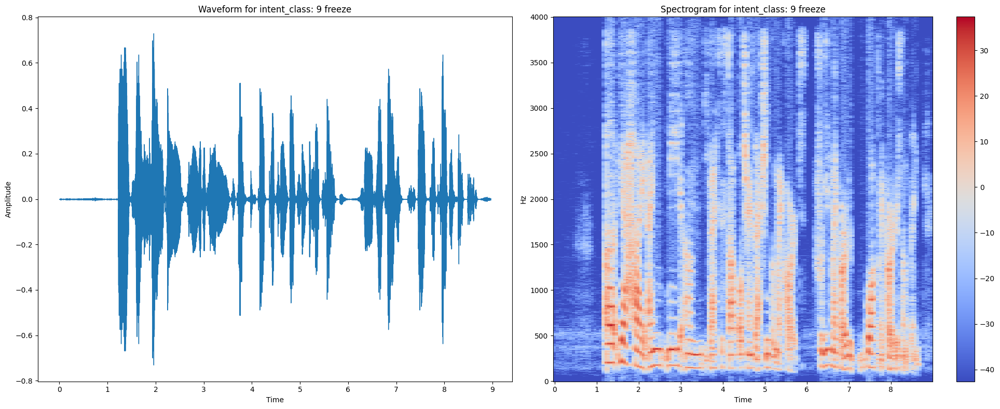

Filter:   0%|          | 0/1809 [00:00<?, ? examples/s]

transcription:  how do I confirm a large email with a text message


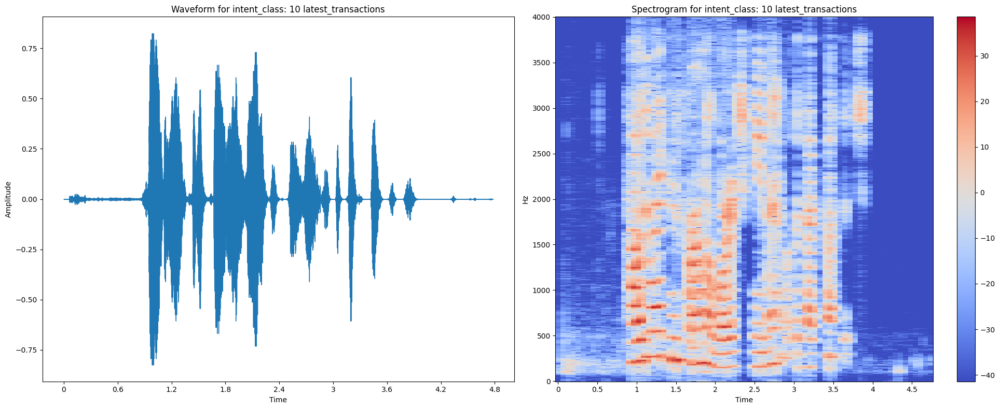

Filter:   0%|          | 0/1809 [00:00<?, ? examples/s]

transcription:  I would like to set up a joint account with my partner


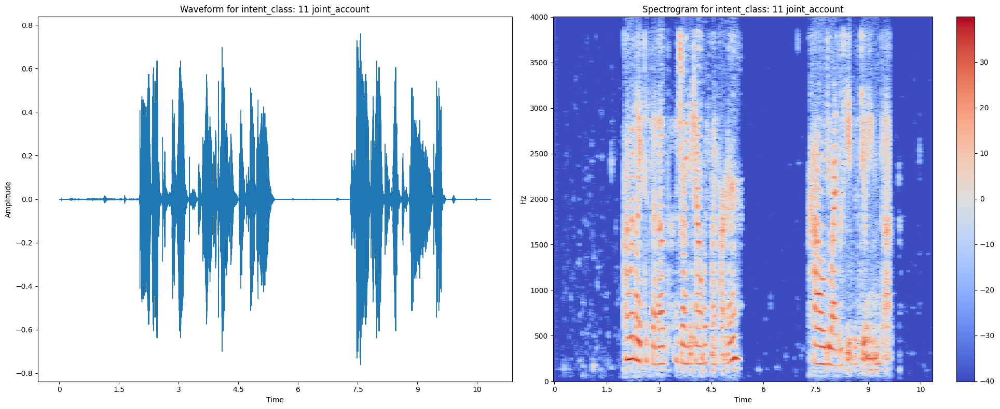

Filter:   0%|          | 0/1809 [00:00<?, ? examples/s]

transcription:  tell me about recent transactions on my card


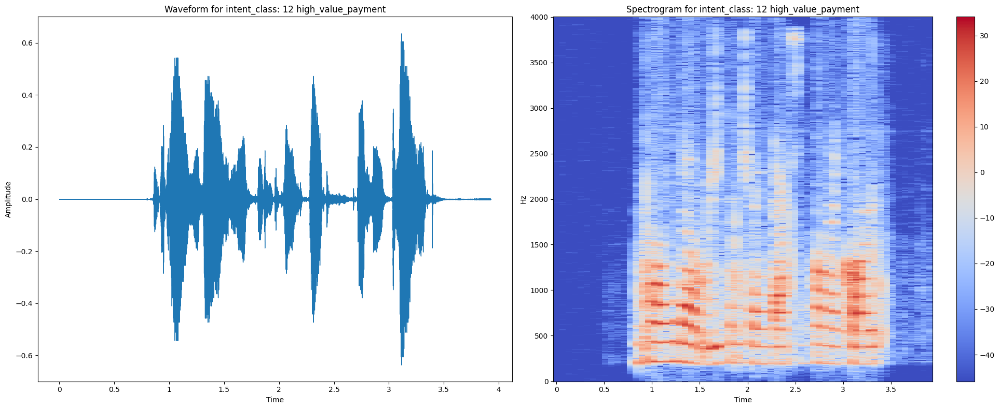

Filter:   0%|          | 0/1809 [00:00<?, ? examples/s]

transcription:  I would like to make a down payment


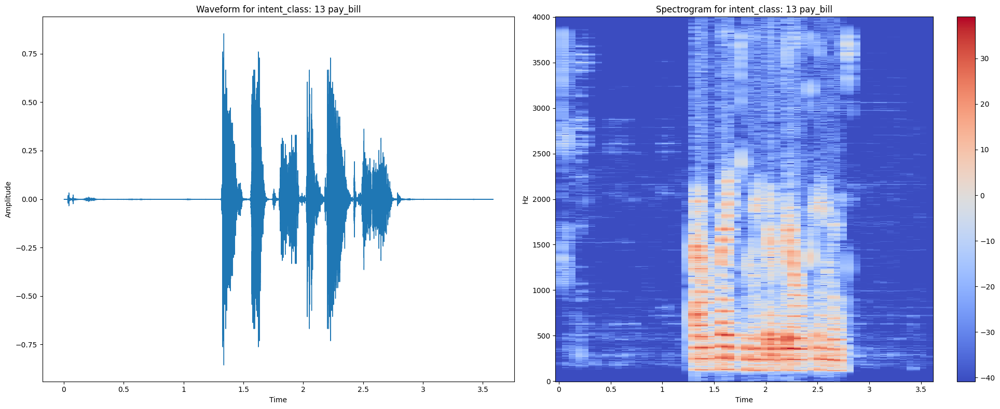

In [ ]:
for intent in range(len(intent_classes)):
  # print(intent)
  # print(intent_classes[intent]['name'])
  plot_waveform_and_spectrogram(merged_dataset, intent, intent_classes[intent]['name'])


In [ ]:
merged_dataset.features

{'path': Value(dtype='string', id=None),
 'audio': Audio(sampling_rate=8000, mono=True, decode=True, id=None),
 'transcription': Value(dtype='string', id=None),
 'english_transcription': Value(dtype='string', id=None),
 'intent_class': ClassLabel(names=['abroad', 'address', 'app_error', 'atm_limit', 'balance', 'business_loan', 'card_issues', 'cash_deposit', 'direct_debit', 'freeze', 'high_value_payment', 'joint_account', 'latest_transactions', 'pay_bill'], id=None),
 'lang_id': ClassLabel(names=['cs-CZ', 'de-DE', 'en-AU', 'en-GB', 'en-US', 'es-ES', 'fr-FR', 'it-IT', 'ko-KR', 'nl-NL', 'pl-PL', 'pt-PT', 'ru-RU', 'zh-CN'], id=None)}

In [ ]:
print(merged_dataset['path'][0])
print(merged_dataset['audio'][0])
print(merged_dataset['transcription'][0])
print(merged_dataset['english_transcription'][0])
print(merged_dataset['intent_class'][0])
print(merged_dataset['lang_id'][0])


/storage/hf-datasets-cache/all/datasets/51125457981586-config-parquet-and-info-PolyAI-minds14-efce24e3/downloads/extracted/cfd42a9443ffb9548ee39e3c64f8b512ca72b9ce5e2ea6b981d44ba6c7265ae8/en-US~JOINT_ACCOUNT/602ba55abb1e6d0fbce92065.wav
{'path': '602ba55abb1e6d0fbce92065.wav', 'array': array([ 0.        ,  0.00024414, -0.00024414, ..., -0.00024414,
        0.        ,  0.        ]), 'sampling_rate': 8000}
I would like to set up a joint account with my partner
I would like to set up a joint account with my partner
11
4


### Check null Values

In [ ]:
def count_feature_lengths(dataset):
    feature_lengths = {}

    for feature in dataset.features:
        values = dataset[feature]
        lengths = [len(str(value)) if not isinstance(value, (int, float, dict, list)) else 1 for value in values]
        feature_lengths[feature] = lengths
    return feature_lengths

# Count the lengths and store them
feature_lengths = count_feature_lengths(merged_dataset)

# Print the lengths for each feature
for feature, lengths in feature_lengths.items():
    print(f"{feature}: {len(lengths)}")

path: 1809
audio: 1809
transcription: 1809
english_transcription: 1809
intent_class: 1809
lang_id: 1809


In [ ]:
# Count the lengths and store them
feature_lengths = count_feature_lengths(minds_enUS)

# Print the lengths for each feature
for feature, lengths in feature_lengths.items():
    print(f"{feature}: {len(lengths)}")

path: 563
audio: 563
transcription: 563
english_transcription: 563
intent_class: 563
lang_id: 563


In [ ]:
# Count the lengths and store them
feature_lengths = count_feature_lengths(minds_enAU)

# Print the lengths for each feature
for feature, lengths in feature_lengths.items():
    print(f"{feature}: {len(lengths)}")

path: 654
audio: 654
transcription: 654
english_transcription: 654
intent_class: 654
lang_id: 654


In [ ]:
# Count the lengths and store them
feature_lengths = count_feature_lengths(minds_enGB)

# Print the lengths for each feature
for feature, lengths in feature_lengths.items():
    print(f"{feature}: {len(lengths)}")

path: 592
audio: 592
transcription: 592
english_transcription: 592
intent_class: 592
lang_id: 592


In [ ]:
def check_null_values(dataset):
    # Convert the dataset to a pandas DataFrame
    df = dataset.to_pandas()

    # Count null values for each column
    return df.isnull().sum().to_dict()

# Example usage:
null_counts = check_null_values(merged_dataset)
print(null_counts)

{'path': 0, 'audio': 0, 'transcription': 0, 'english_transcription': 0, 'intent_class': 0, 'lang_id': 0}


### Check Duplicate values in Transcription

In [ ]:
merged_dataset

Dataset({
    features: ['path', 'audio', 'transcription', 'english_transcription', 'intent_class', 'lang_id'],
    num_rows: 1809
})

In [ ]:
from collections import Counter

def check_duplicate_transcriptions(dataset):
    # Extract the transcription column
    transcriptions = dataset['transcription']

    # Count occurrences of each transcription
    transcription_counts = Counter(transcriptions)

    # Filter out transcriptions that appear more than once
    duplicates = {transcription: count for transcription, count in transcription_counts.items() if count > 1}

    return duplicates

# Example usage:
duplicates = check_duplicate_transcriptions(merged_dataset)
print(duplicates)

{'how do I set up a joint account': 8, "I'd like to set up a joint account": 2, 'what is my account balance': 7, 'account balance': 4, 'show me my account balance please': 3, 'show me my account balance': 9, 'show me my current account balance': 2, "what's my account balance": 2, 'please show me my account balance': 4, 'I would like to make a payment': 3, 'make a bill payment': 2, 'I need to make a payment': 3, 'I need to pay my credit card bill': 2, 'I have to pay a bill': 3, 'freeze my card please': 2, "I'd like to freeze my card": 2, 'I need to freeze my card': 3, 'freeze my card': 5, 'please stop all transactions on my card': 3, 'the app is not working': 2, 'I would like to change my address': 7, 'how do I change my address': 2, 'I need to change my address': 3, 'I want to change my address': 15, "I'd like to change my address": 2, 'I wanted to change my address': 2, 'my address I want to change my address': 2, 'how do I set up a direct debit': 3, 'can you tell me about direct debi

In [ ]:
len(duplicates)

68

# Dataset Preprocessing

So we have no null values on the dataset but we have unbalance data in intent_class, but since we gonna make Automatic Speech Recognition we not gonna use that.

Now here we gonna split dataset and remove unused columns.

In [ ]:
merged_dataset = merged_dataset.train_test_split(test_size=0.2)
print("split: ", merged_dataset)

merged_dataset = merged_dataset.remove_columns(
    ["english_transcription",
    "intent_class",
    "lang_id",]
)
print("remove column: ", merged_dataset)

print(merged_dataset['train']['path'][0])
print(merged_dataset['train']['audio'][0]['array'])
print(merged_dataset['train']['audio'][0]['sampling_rate'])
print(merged_dataset['train']['transcription'][0])

split:  DatasetDict({
    train: Dataset({
        features: ['path', 'audio', 'transcription', 'english_transcription', 'intent_class', 'lang_id'],
        num_rows: 1447
    })
    test: Dataset({
        features: ['path', 'audio', 'transcription', 'english_transcription', 'intent_class', 'lang_id'],
        num_rows: 362
    })
})
remove column:  DatasetDict({
    train: Dataset({
        features: ['path', 'audio', 'transcription'],
        num_rows: 1447
    })
    test: Dataset({
        features: ['path', 'audio', 'transcription'],
        num_rows: 362
    })
})
/storage/hf-datasets-cache/all/datasets/27907695716030-config-parquet-and-info-PolyAI-minds14-941a5af2/downloads/extracted/a87e442545495cdb67dfdcbc9d4f35d234c9f8e471449b2db58d7c81b62f001a/en-AU~BALANCE/CA8b5235c5c4f15e54ca9916ce5814a023_4.wav
[-0.00024414  0.00024414 -0.00024414 ...  0.00024414  0.00024414
  0.00024414]
8000
current account balance


### Check Transcription

cause we merge different subdataset we should check the transcription.

In [ ]:
def show_random_elements(dataset, num_examples=10):
    assert num_examples <= len(dataset), "Can't pick more elements than there are in the dataset."
    picks = []
    for _ in range(num_examples):
        pick = random.randint(0, len(dataset)-1)
        while pick in picks:
            pick = random.randint(0, len(dataset)-1)
        picks.append(pick)

    df = pd.DataFrame(dataset[picks])
    display(HTML(df.to_html()))


show_random_elements(dataset=merged_dataset['train'].remove_columns(['audio', 'path']), num_examples=10)

,transcription
0,hi about to cancel one of my Direct debits please I don't need to be paying anymore
1,what's the most amount of money I can withdraw at one time and during an entire day from an ATM machine
2,I'm calling to check my account balance on my savings account
3,I need some help to freeze my card
4,how do I set up a joint account
5,I have a question about a business loan
6,how much money would I be able to withdraw the ATM
7,hi I'm trying to use the app but it won't load my account balance I'm able to use it
8,yes I recognise the payment
9,hello is this the bank ID like to change my address please


Remove the punctuation, and lower cased the text and remove double spacing.

In [ ]:
chars_to_ignore_regex = '[\,\?\.\!\-\;\:\"]'

def remove_special_characters(batch):
    batch["transcription"] = re.sub(chars_to_ignore_regex, '', batch["transcription"]).lower() + " "
    batch["transcription"] = batch['transcription'].rstrip()
    return batch

merged_dataset = merged_dataset.map(remove_special_characters)

Map:   0%|          | 0/1447 [00:00<?, ? examples/s]

Map:   0%|          | 0/362 [00:00<?, ? examples/s]

In [ ]:
show_random_elements(dataset=merged_dataset['train'].remove_columns(['audio', 'path']), num_examples=10)

,transcription
0,how do i go about depositing money in my account
1,how much in total can i withdraw from the atm
2,hi i was wondering if you can help me i've been trying to use my card and it won't pay
3,how can i put money into my bank account
4,can you show me on my outgoing direct debits
5,i'm trying to make a large payment online and you're supposed to be sending me a confirmation code via sms
6,i would like to withdraw money from an atm and i'm wondering what the maximum amount of money i can withdraw at one time is
7,i was wanting to set up a joint account with my spouse and i was wondering do we each get separate card debit card and separate way of knowing who is accessing the thank you
8,hi i'm trying to use my card in the shop and it won't work
9,the app isn't loading properly it is not loading my new account balance


### Create Vocabulary

In [ ]:
def extract_all_chars(batch):
  all_text = " ".join(batch["transcription"])
  vocab = list(set(all_text))
  return {"vocab": [vocab], "all_text": [all_text]}

vocabs = merged_dataset.map(
    extract_all_chars,
    batched=True,
    batch_size=1,
    keep_in_memory=True,
    remove_columns=merged_dataset.column_names['train']
)

vocab_list = list(set(vocabs["train"]["vocab"][0]) | set(vocabs["test"]["vocab"][0]))
vocab_dict = {v: k for k, v in enumerate(vocab_list)}
print(vocab_dict)

vocab_dict["|"] = vocab_dict[" "]
del vocab_dict [" "]

vocab_dict["[UNK]"] = len(vocab_dict)
vocab_dict["[PAD]"] = len(vocab_dict)
print(len(vocab_dict))

# with open('vocab.json', 'w') as vocab_file:
#     json.dump(vocab_dict, vocab_file)

Map:   0%|          | 0/1447 [00:00<?, ? examples/s]

Map:   0%|          | 0/362 [00:00<?, ? examples/s]

{'h': 0, 'b': 1, 'k': 2, 'a': 3, 'f': 4, "'": 5, 'u': 6, 'c': 7, 'g': 8, 's': 9, ' ': 10, 'i': 11, 'm': 12, 'e': 13, 'n': 14, 'r': 15, 'd': 16, 't': 17, 'o': 18, 'y': 19, 'w': 20, 'l': 21, 'v': 22, 'p': 23, 'j': 24}
27


### Change Sampling Rate Audio

cause minds14 using 8000 sampling rate we need to change it to 16000.

In [ ]:
import IPython.display as ipd

In [ ]:
rand_int = random.randint(0, len(merged_dataset['train']))

print(merged_dataset['train'][rand_int]['transcription'])
ipd.Audio(data=np.asarray(merged_dataset['train'][rand_int]['audio']['array']), autoplay=True, rate=8000)

i want to deposit money in my account and so how can i go about how can i go about how do i do that


In [ ]:
rand_int = random.randint(0, len(merged_dataset['train']))

print(merged_dataset['train'][rand_int]['transcription'])
ipd.Audio(data=np.asarray(merged_dataset['train'][rand_int]['audio']['array']), autoplay=True, rate=16000)

i'm making a large payment online and i'm getting a text message with a code and i'm not sure what it's supposed to do


In [ ]:
from datasets import Audio

merged_dataset = merged_dataset.cast_column("audio", Audio(sampling_rate=16_000))
merged_dataset['train'][0]

{'path': '/storage/hf-datasets-cache/all/datasets/27907695716030-config-parquet-and-info-PolyAI-minds14-941a5af2/downloads/extracted/a87e442545495cdb67dfdcbc9d4f35d234c9f8e471449b2db58d7c81b62f001a/en-AU~BALANCE/CA8b5235c5c4f15e54ca9916ce5814a023_4.wav',
 'audio': {'path': 'CA8b5235c5c4f15e54ca9916ce5814a023_4.wav',
  'array': array([-2.26006057e-04,  4.36453993e-05,  2.27948753e-04, ...,
          2.07029865e-04,  2.23208510e-04,  1.70917396e-04]),
  'sampling_rate': 16000},
 'transcription': 'current account balance'}

# Extract Dataset

Now the las thing we need to extract the features we gonna use, for ASR the features we gonna use is audio['array'] as input_values and ['transcription'] as labels. And We gonna use WhisperProcessor, WhisperFeatureExtractor and WhisperTokenizer to extract the features.

In [ ]:
whisper = 'openai/whisper-tiny'

tokenizer = WhisperTokenizer.from_pretrained(whisper, language="english")
feature_extractor = WhisperFeatureExtractor.from_pretrained(whisper)
processor = WhisperProcessor(
    feature_extractor=feature_extractor,
    tokenizer=tokenizer,
    )

model = WhisperForConditionalGeneration.from_pretrained(whisper)
model.config.forced_decoder_ids = None

tokenizer_config.json:   0%|          | 0.00/805 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/836k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/2.48M [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/494k [00:00<?, ?B/s]

normalizer.json:   0%|          | 0.00/52.7k [00:00<?, ?B/s]

added_tokens.json:   0%|          | 0.00/34.6k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/2.08k [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/185k [00:00<?, ?B/s]

config.json:   0%|          | 0.00/1.98k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/151M [00:00<?, ?B/s]

generation_config.json:   0%|          | 0.00/3.72k [00:00<?, ?B/s]

### Test the Processor

before using it we should testit and makesure everything work, cause sometimes extracting features realy take long time.

In [ ]:
merged_dataset['train']['audio'][0]['sampling_rate']

16000

In [ ]:
audio_array = merged_dataset['train']['audio'][0]['array']
audio_sr = merged_dataset['train']['audio'][0]['sampling_rate']
audio_text = merged_dataset['train']['transcription'][0]

encoded_input = processor(
    audio_array,
    sampling_rate=audio_sr,
    return_tensors='pt',
).input_features

encoded_label = processor(
    text=audio_text,
    return_tensors='pt',
).input_ids

print("array: ", audio_array)
print("text: ", audio_text)
print("#"*50)
print("feature: ", encoded_input)
print("label: ", encoded_label)

array:  [-2.26006057e-04  4.36453993e-05  2.27948753e-04 ...  2.07029865e-04
  2.23208510e-04  1.70917396e-04]
text:  current account balance
##################################################
feature:  tensor([[[-0.4741, -0.4098, -0.5306,  ..., -0.7441, -0.7441, -0.7441],
         [-0.6040, -0.4607, -0.4837,  ..., -0.7441, -0.7441, -0.7441],
         [-0.5929, -0.5646, -0.4605,  ..., -0.7441, -0.7441, -0.7441],
         ...,
         [-0.7441, -0.7441, -0.7441,  ..., -0.7441, -0.7441, -0.7441],
         [-0.7441, -0.7441, -0.7441,  ..., -0.7441, -0.7441, -0.7441],
         [-0.7441, -0.7441, -0.7441,  ..., -0.7441, -0.7441, -0.7441]]])
label:  tensor([[50258, 50259, 50363, 49827,  2696,  4772, 50257]])


In [ ]:
predicted_ids = model.generate(encoded_input)

In [ ]:
decoded_predict = processor.batch_decode(predicted_ids, skip_special_tokens=True)
decoded_label = processor.batch_decode(encoded_label, skip_special_tokens=True)

print("decoded predict: ", decoded_predict)
print("decoded label: ", decoded_label)

decoded predict:  [' Check current account balance.']
decoded label:  ['current account balance']


## Extract
If the processor work, next we can extract all features.

In [ ]:
def prepare_datasets(batch):
  audio = batch['audio']

  batch = processor(
      audio=audio['array'],
      sampling_rate=audio['sampling_rate'],
      text=batch['transcription'],
  )

  batch['input_length'] = len(audio['array']) / audio['sampling_rate']

  return batch

encoded_datasets = merged_dataset.map(
    prepare_datasets,
    remove_columns=merged_dataset.column_names['train'],
    num_proc=4,
)

Map (num_proc=4):   0%|          | 0/1447 [00:00<?, ? examples/s]

Map (num_proc=4):   0%|          | 0/362 [00:00<?, ? examples/s]

check the otput

In [ ]:
print(encoded_datasets)

# print(np.shape(encoded_datasets['test']['input_features']))
# print(np.shape(encoded_datasets['test']['labels']))

DatasetDict({
    train: Dataset({
        features: ['input_features', 'labels', 'input_length'],
        num_rows: 1447
    })
    test: Dataset({
        features: ['input_features', 'labels', 'input_length'],
        num_rows: 362
    })
})


# Build Model

Build custom data collator for seq2seq with padding

In [ ]:
@dataclass
class DataCollatorSpeechSeq2SeqWithPadding:
    processor: Any

    def __call__(
        self, features: List[Dict[str, Union[List[int], torch.Tensor]]]
    ) -> Dict[str, torch.Tensor]:
        input_features = [
            {"input_features": feature["input_features"][0]} for feature in features
        ]
        batch = self.processor.feature_extractor.pad(input_features, return_tensors="pt")

        label_features = [{"input_ids": feature["labels"]} for feature in features]
        labels_batch = self.processor.tokenizer.pad(label_features, return_tensors="pt")

        labels = labels_batch["input_ids"].masked_fill(
            labels_batch.attention_mask.ne(1), -100
        )

        if (labels[:, 0] == self.processor.tokenizer.bos_token_id).all().cpu().item():
            labels = labels[:, 1:]

        batch["labels"] = labels

        return batch

data_collator = DataCollatorSpeechSeq2SeqWithPadding(processor=processor)

Load WER metric and create function compute_metric

In [ ]:
metric_wer = evaluate.load("wer")

In [ ]:
from transformers.models.whisper.english_normalizer import BasicTextNormalizer
from nltk.translate.bleu_score import corpus_bleu
from nltk.translate.bleu_score import SmoothingFunction
# from nltk.translate import rouge_score
from rouge import Rouge
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import f1_score, r2_score

normalizer = BasicTextNormalizer()
smoother = SmoothingFunction()

rouge_score = Rouge()

def compute_f1(preds, labels):
    # Convert predictions and labels to binary (0 or 1)
    preds_binary = [1 if p == l else 0 for p, l in zip(preds, labels)]
    labels_binary = [1 if l != processor.tokenizer.pad_token_id else 0 for l in labels]  # Assuming padding token ID is used for no label

    return f1_score(labels_binary, preds_binary)

def compute_r2(preds, labels):
    try:
        # Convert strings to floating-point numbers
        preds_float = np.array([float(p) for p in preds])
        labels_float = np.array([float(l) for l in labels])

        # Calculate R2 score
        return r2_score(labels_float, preds_float)
    except ValueError as e:
        print(f"Error: {e}")
        return None

def compute_metrics(pred):
    pred_ids = pred.predictions
    label_ids = pred.label_ids

    label_ids[label_ids == -100] = processor.tokenizer.pad_token_id

    pred_str = processor.batch_decode(pred_ids, skip_special_tokens=True)
    label_str = processor.batch_decode(label_ids, skip_special_tokens=True)

    # Word Error Rate (WER)
    wer_ortho = 100 * metric_wer.compute(predictions=pred_str, references=label_str)

    # Normalized WER
    pred_str_norm = [normalizer(pred) for pred in pred_str]
    label_str_norm = [normalizer(label) for label in label_str]

    wer = metric_wer.compute(predictions=pred_str_norm, references=label_str_norm)

    # Accuracy
    correct_preds = sum(1 for p, l in zip(pred_str_norm, label_str_norm) if p == l)
    total_preds = len(pred_str_norm)
    accuracy = correct_preds / total_preds

    # ROUGE Metrics
    rouge_scores = rouge_score.get_scores(pred_str_norm, label_str_norm, avg=True)

    # F1 Score, R2,
    # (Assuming you have the necessary functions or metrics for these calculations)
    f1_score = compute_f1(pred_str_norm, label_str_norm)
    r2_score = compute_r2(pred_ids, label_ids)

    # BLEU Score
    references = [[ref.split()] for ref in label_str_norm]
    predictions = [pred.split() for pred in pred_str_norm]
    bleu_score = corpus_bleu(references, predictions, smoothing_function=smoother.method1)

    return {
        "wer_ortho": wer_ortho,
        "wer": wer,
        "accuracy": accuracy,
        # "rouge_scores": rouge_scores,
        "f1_score": f1_score,
        "r2_score": r2_score,
        "bleu_score": bleu_score,
        "Rouge 1 r": rouge_scores['rouge-1']['r'],
        "Rouge 1 p": rouge_scores['rouge-1']['p'],
        "Rouge 1 f": rouge_scores['rouge-1']['f'],
        "Rouge 2 r": rouge_scores['rouge-2']['r'],
        "Rouge 2 p": rouge_scores['rouge-2']['p'],
        "Rouge 2 f": rouge_scores['rouge-2']['f'],
        "Rouge l r": rouge_scores['rouge-l']['r'],
        "Rouge l p": rouge_scores['rouge-l']['p'],
        "Rouge l f": rouge_scores['rouge-l']['f'],
    }

# def compute_metrics(pred):
#     pred_ids = pred.predictions
#     label_ids = pred.label_ids

#     label_ids[label_ids == -100] = processor.tokenizer.pad_token_id

#     pred_str = processor.batch_decode(pred_ids, skip_special_tokens=True)
#     label_str = processor.batch_decode(label_ids, skip_special_tokens=True)

#     wer_ortho = 100 * metric_wer.compute(predictions=pred_str, references=label_str)

#     pred_str_norm = [normalizer(pred) for pred in pred_str]
#     label_str_norm = [normalizer(label) for label in label_str]
#     pred_str_norm = [
#         pred_str_norm[i] for i in range(len(pred_str_norm)) if len(label_str_norm[i]) > 0
#     ]
#     label_str_norm = [
#         label_str_norm[i]
#         for i in range(len(label_str_norm))
#         if len(label_str_norm[i]) > 0
#     ]

#     wer = metric_wer.compute(predictions=pred_str_norm, references=label_str_norm)

#     return {"wer_ortho": wer_ortho, "wer": wer}

Defined the model

In [ ]:
from functools import partial

model.config.use_cache = False
model.generate = partial(
    model.generate,
    language="english",
    task="transcribe",
    use_cache=True,
)

# Training

In [ ]:
training_args = Seq2SeqTrainingArguments(
    output_dir="./whisper-tiny-minds14-english",
    # num_train_epochs=4,
    per_device_train_batch_size=8,
    gradient_accumulation_steps=1,  # increase by 2x for every 2x decrease in batch size
    learning_rate=1e-5,
    lr_scheduler_type="constant_with_warmup",
    warmup_steps=50,
    max_steps=1000,
    gradient_checkpointing=True,
    fp16=True,
    fp16_full_eval=True,
    evaluation_strategy="steps",
    per_device_eval_batch_size=8,
    predict_with_generate=True,
    generation_max_length=225,
    save_steps=100,
    eval_steps=100,
    logging_steps=100,
    report_to=["tensorboard"],
    load_best_model_at_end=True,
    metric_for_best_model="wer",
    greater_is_better=False,
)

trainer = Seq2SeqTrainer(
    args= training_args,
    model=model,
    train_dataset=encoded_datasets['train'],
    eval_dataset=encoded_datasets['test'],
    data_collator=data_collator,
    compute_metrics=compute_metrics,
    tokenizer=processor,
    # optimizers=optimizer, # default optimizer is AdamW
)


In [ ]:
trainer.train()

/usr/local/lib/python3.10/dist-packages/torch/utils/checkpoint.py:429: UserWarning: torch.utils.checkpoint: please pass in use_reentrant=True or use_reentrant=False explicitly. The default value of use_reentrant will be updated to be False in the future. To maintain current behavior, pass use_reentrant=True. It is recommended that you use use_reentrant=False. Refer to docs for more details on the differences between the two variants.
  warnings.warn(


Step,Training Loss,Validation Loss,Wer Ortho,Wer,Accuracy,Rouge Scores,F1 Score,R2 Score,Bleu Score
100,0.261600,0.504767,27.360608,0.274669,0.295580,"{'rouge-1': {'r': 0.8878685873417582, 'p': 0.8413295449694195, 'f': 0.8578430759433117}, 'rouge-2': {'r': 0.8084993873029671, 'p': 0.7616908653577612, 'f': 0.777190691635487}, 'rouge-l': {'r': 0.8860385098375317, 'p': 0.8397805792845368, 'f': 0.8562011083312231}}",0.456290,None,0.665550
200,0.407500,0.468822,26.808217,0.268212,0.334254,"{'rouge-1': {'r': 0.8942894658183047, 'p': 0.8503595144842875, 'f': 0.8654886227171176}, 'rouge-2': {'r': 0.8231615993107027, 'p': 0.7762527805930625, 'f': 0.7917962768609182}, 'rouge-l': {'r': 0.8918454785430099, 'p': 0.8484356869472554, 'f': 0.8633712154979571}}",0.501035,None,0.678469
300,0.227600,0.470457,26.721906,0.267881,0.339779,"{'rouge-1': {'r': 0.8983456142601195, 'p': 0.8498875372169739, 'f': 0.8670650201910174}, 'rouge-2': {'r': 0.8241741615428694, 'p': 0.7763001511842144, 'f': 0.7922564497759582}, 'rouge-l': {'r': 0.8959603974634449, 'p': 0.848104943569891, 'f': 0.8650910143630575}}",0.507216,None,0.674724
400,0.198400,0.483639,26.204039,0.263245,0.331492,"{'rouge-1': {'r': 0.8926369694620958, 'p': 0.849195071685992, 'f': 0.8642130789828093}, 'rouge-2': {'r': 0.8183509168740594, 'p': 0.7758932272026274, 'f': 0.789402153771798}, 'rouge-l': {'r': 0.890732212583036, 'p': 0.8474120789974753, 'f': 0.862400691992501}}",0.497925,None,0.679189
500,0.130600,0.498780,27.032626,0.272020,0.331492,"{'rouge-1': {'r': 0.8878042716735213, 'p': 0.8468512800306599, 'f': 0.8609963389100848}, 'rouge-2': {'r': 0.8102517161665026, 'p': 0.7702490686383049, 'f': 0.7830392476183468}, 'rouge-l': {'r': 0.8857119517841371, 'p': 0.8451381116811684, 'f': 0.8591414827226767}}",0.497925,None,0.666743
600,0.073900,0.502715,25.962368,0.260927,0.317680,"{'rouge-1': {'r': 0.8883269654475934, 'p': 0.8489649208120409, 'f': 0.8624923503729183}, 'rouge-2': {'r': 0.8120508982234872, 'p': 0.7723434302378962, 'f': 0.7850953846907992}, 'rouge-l': {'r': 0.885725102614642, 'p': 0.8468625582428252, 'f': 0.8602021426083934}}",0.482180,None,0.674881
700,0.070300,0.518900,26.324875,0.263742,0.331492,"{'rouge-1': {'r': 0.885521727560341, 'p': 0.8447783791889989, 'f': 0.8587625798093784}, 'rouge-2': {'r': 0.810257760222236, 'p': 0.7695495537721923, 'f': 0.7825158665004827}, 'rouge-l': {'r': 0.8831404634496698, 'p': 0.8427066826569269, 'f': 0.8565692802525519}}",0.497925,None,0.673035
800,0.037000,0.550803,27.170723,0.274503,0.328729,"{'rouge-1': {'r': 0.886836169909288, 'p': 0.8426888353220197, 'f': 0.8582652529119994}, 'rouge-2': {'r': 0.8107830893218897, 'p': 0.7672592562680048, 'f': 0.7815538476304041}, 'rouge-l': {'r': 0.8846534274397561, 'p': 0.8408661063227679, 'f': 0.85630510569789}}",0.494802,None,0.663122
900,0.033200,0.532614,25.824271,0.260596,0.334254,"{'rouge-1': {'r': 0.8895989246967014, 'p': 0.8504121931501549, 'f': 0.8633158062528307}, 'rouge-2': {'r': 0.813611999090495, 'p': 0.7756217220659288, 'f': 0.7874450185628559}, 'rouge-l': {'r': 0.8885420801573776, 'p': 0.8495923004006033, 'f': 0.8624000856505823}}",0.501035,None,0.678317
1000,0.013600,0.570478,24.978422,0.250828,0.342541,"{'rouge-1': {'r': 0.8924371436775868, 'p': 0.8524709114821905, 'f': 0.866747500960263}, 'rouge-2': {'r': 0.8187635845924567, 'p': 0.7798682627988174, 'f': 0.7927217685416955}, 'rouge-l': {'r': 0.8898080993433066, 'p': 0.8502456157552221, 'f': 0.8643557829555472}}",0.510288,None,0.684269


Trainer is attempting to log a value of "{'rouge-1': {'r': 0.8878685873417582, 'p': 0.8413295449694195, 'f': 0.8578430759433117}, 'rouge-2': {'r': 0.8084993873029671, 'p': 0.7616908653577612, 'f': 0.777190691635487}, 'rouge-l': {'r': 0.8860385098375317, 'p': 0.8397805792845368, 'f': 0.8562011083312231}}" of type <class 'dict'> for key "eval/rouge_scores" as a scalar. This invocation of Tensorboard's writer.add_scalar() is incorrect so we dropped this attribute.
Trainer is attempting to log a value of "None" of type <class 'NoneType'> for key "eval/r2_score" as a scalar. This invocation of Tensorboard's writer.add_scalar() is incorrect so we dropped this attribute.


Error: could not convert string to float: 'hi i m going to be traveling abroad and going to pan and i just wondered if i m going to be able to use my bank card when i m there if you could let me know that would be great thank you'


/usr/local/lib/python3.10/dist-packages/torch/utils/checkpoint.py:429: UserWarning: torch.utils.checkpoint: please pass in use_reentrant=True or use_reentrant=False explicitly. The default value of use_reentrant will be updated to be False in the future. To maintain current behavior, pass use_reentrant=True. It is recommended that you use use_reentrant=False. Refer to docs for more details on the differences between the two variants.
  warnings.warn(
Trainer is attempting to log a value of "{'rouge-1': {'r': 0.8942894658183047, 'p': 0.8503595144842875, 'f': 0.8654886227171176}, 'rouge-2': {'r': 0.8231615993107027, 'p': 0.7762527805930625, 'f': 0.7917962768609182}, 'rouge-l': {'r': 0.8918454785430099, 'p': 0.8484356869472554, 'f': 0.8633712154979571}}" of type <class 'dict'> for key "eval/rouge_scores" as a scalar. This invocation of Tensorboard's writer.add_scalar() is incorrect so we dropped this attribute.
Trainer is attempting to log a value of "None" of type <class 'NoneType'> for 

Error: could not convert string to float: 'hi i m going to be traveling abroad and going to pan and i just wondered if i m going to be able to use my bank card when i m there if you could let me know that would be great thank you'


/usr/local/lib/python3.10/dist-packages/torch/utils/checkpoint.py:429: UserWarning: torch.utils.checkpoint: please pass in use_reentrant=True or use_reentrant=False explicitly. The default value of use_reentrant will be updated to be False in the future. To maintain current behavior, pass use_reentrant=True. It is recommended that you use use_reentrant=False. Refer to docs for more details on the differences between the two variants.
  warnings.warn(
Trainer is attempting to log a value of "{'rouge-1': {'r': 0.8983456142601195, 'p': 0.8498875372169739, 'f': 0.8670650201910174}, 'rouge-2': {'r': 0.8241741615428694, 'p': 0.7763001511842144, 'f': 0.7922564497759582}, 'rouge-l': {'r': 0.8959603974634449, 'p': 0.848104943569891, 'f': 0.8650910143630575}}" of type <class 'dict'> for key "eval/rouge_scores" as a scalar. This invocation of Tensorboard's writer.add_scalar() is incorrect so we dropped this attribute.
Trainer is attempting to log a value of "None" of type <class 'NoneType'> for k

Error: could not convert string to float: 'hi i m going to be traveling abroad and going to pan and i just wondered if i m going to be able to use my bank card when i m there if you could let me know that would be great thank you'


/usr/local/lib/python3.10/dist-packages/torch/utils/checkpoint.py:429: UserWarning: torch.utils.checkpoint: please pass in use_reentrant=True or use_reentrant=False explicitly. The default value of use_reentrant will be updated to be False in the future. To maintain current behavior, pass use_reentrant=True. It is recommended that you use use_reentrant=False. Refer to docs for more details on the differences between the two variants.
  warnings.warn(
Trainer is attempting to log a value of "{'rouge-1': {'r': 0.8926369694620958, 'p': 0.849195071685992, 'f': 0.8642130789828093}, 'rouge-2': {'r': 0.8183509168740594, 'p': 0.7758932272026274, 'f': 0.789402153771798}, 'rouge-l': {'r': 0.890732212583036, 'p': 0.8474120789974753, 'f': 0.862400691992501}}" of type <class 'dict'> for key "eval/rouge_scores" as a scalar. This invocation of Tensorboard's writer.add_scalar() is incorrect so we dropped this attribute.
Trainer is attempting to log a value of "None" of type <class 'NoneType'> for key 

Error: could not convert string to float: 'hi i m going to be traveling abroad and going to pan and i just wondered if i m going to be able to use my bank card when i m there if you could let me know that would be great thank you'


/usr/local/lib/python3.10/dist-packages/torch/utils/checkpoint.py:429: UserWarning: torch.utils.checkpoint: please pass in use_reentrant=True or use_reentrant=False explicitly. The default value of use_reentrant will be updated to be False in the future. To maintain current behavior, pass use_reentrant=True. It is recommended that you use use_reentrant=False. Refer to docs for more details on the differences between the two variants.
  warnings.warn(
Trainer is attempting to log a value of "{'rouge-1': {'r': 0.8878042716735213, 'p': 0.8468512800306599, 'f': 0.8609963389100848}, 'rouge-2': {'r': 0.8102517161665026, 'p': 0.7702490686383049, 'f': 0.7830392476183468}, 'rouge-l': {'r': 0.8857119517841371, 'p': 0.8451381116811684, 'f': 0.8591414827226767}}" of type <class 'dict'> for key "eval/rouge_scores" as a scalar. This invocation of Tensorboard's writer.add_scalar() is incorrect so we dropped this attribute.
Trainer is attempting to log a value of "None" of type <class 'NoneType'> for 

Error: could not convert string to float: 'hi i m going to be traveling abroad and going to pan and i just wondered if i m going to be able to use my bank card when i m there if you could let me know that would be great thank you'


/usr/local/lib/python3.10/dist-packages/torch/utils/checkpoint.py:429: UserWarning: torch.utils.checkpoint: please pass in use_reentrant=True or use_reentrant=False explicitly. The default value of use_reentrant will be updated to be False in the future. To maintain current behavior, pass use_reentrant=True. It is recommended that you use use_reentrant=False. Refer to docs for more details on the differences between the two variants.
  warnings.warn(
Trainer is attempting to log a value of "{'rouge-1': {'r': 0.8883269654475934, 'p': 0.8489649208120409, 'f': 0.8624923503729183}, 'rouge-2': {'r': 0.8120508982234872, 'p': 0.7723434302378962, 'f': 0.7850953846907992}, 'rouge-l': {'r': 0.885725102614642, 'p': 0.8468625582428252, 'f': 0.8602021426083934}}" of type <class 'dict'> for key "eval/rouge_scores" as a scalar. This invocation of Tensorboard's writer.add_scalar() is incorrect so we dropped this attribute.
Trainer is attempting to log a value of "None" of type <class 'NoneType'> for k

Error: could not convert string to float: 'hi i m going to be traveling abroad and going to pam and i just wondered if i m going to be able to use my bank card with on there if you could let me know that would be great thank you'


/usr/local/lib/python3.10/dist-packages/torch/utils/checkpoint.py:429: UserWarning: torch.utils.checkpoint: please pass in use_reentrant=True or use_reentrant=False explicitly. The default value of use_reentrant will be updated to be False in the future. To maintain current behavior, pass use_reentrant=True. It is recommended that you use use_reentrant=False. Refer to docs for more details on the differences between the two variants.
  warnings.warn(
Trainer is attempting to log a value of "{'rouge-1': {'r': 0.885521727560341, 'p': 0.8447783791889989, 'f': 0.8587625798093784}, 'rouge-2': {'r': 0.810257760222236, 'p': 0.7695495537721923, 'f': 0.7825158665004827}, 'rouge-l': {'r': 0.8831404634496698, 'p': 0.8427066826569269, 'f': 0.8565692802525519}}" of type <class 'dict'> for key "eval/rouge_scores" as a scalar. This invocation of Tensorboard's writer.add_scalar() is incorrect so we dropped this attribute.
Trainer is attempting to log a value of "None" of type <class 'NoneType'> for ke

Error: could not convert string to float: 'hi i m going to be travelling abroad and going to pan and i just wondered if i m going to be able to use my bank card when i m there if you could let me know that would be great thank you'


/usr/local/lib/python3.10/dist-packages/torch/utils/checkpoint.py:429: UserWarning: torch.utils.checkpoint: please pass in use_reentrant=True or use_reentrant=False explicitly. The default value of use_reentrant will be updated to be False in the future. To maintain current behavior, pass use_reentrant=True. It is recommended that you use use_reentrant=False. Refer to docs for more details on the differences between the two variants.
  warnings.warn(
Trainer is attempting to log a value of "{'rouge-1': {'r': 0.886836169909288, 'p': 0.8426888353220197, 'f': 0.8582652529119994}, 'rouge-2': {'r': 0.8107830893218897, 'p': 0.7672592562680048, 'f': 0.7815538476304041}, 'rouge-l': {'r': 0.8846534274397561, 'p': 0.8408661063227679, 'f': 0.85630510569789}}" of type <class 'dict'> for key "eval/rouge_scores" as a scalar. This invocation of Tensorboard's writer.add_scalar() is incorrect so we dropped this attribute.
Trainer is attempting to log a value of "None" of type <class 'NoneType'> for key

Error: could not convert string to float: 'hi i m going to be travelling abroad and going to pan and i just wondered if i m going to be able to use my bank card when i m there if you could let me know that would be great thank you'


/usr/local/lib/python3.10/dist-packages/torch/utils/checkpoint.py:429: UserWarning: torch.utils.checkpoint: please pass in use_reentrant=True or use_reentrant=False explicitly. The default value of use_reentrant will be updated to be False in the future. To maintain current behavior, pass use_reentrant=True. It is recommended that you use use_reentrant=False. Refer to docs for more details on the differences between the two variants.
  warnings.warn(
Trainer is attempting to log a value of "{'rouge-1': {'r': 0.8895989246967014, 'p': 0.8504121931501549, 'f': 0.8633158062528307}, 'rouge-2': {'r': 0.813611999090495, 'p': 0.7756217220659288, 'f': 0.7874450185628559}, 'rouge-l': {'r': 0.8885420801573776, 'p': 0.8495923004006033, 'f': 0.8624000856505823}}" of type <class 'dict'> for key "eval/rouge_scores" as a scalar. This invocation of Tensorboard's writer.add_scalar() is incorrect so we dropped this attribute.
Trainer is attempting to log a value of "None" of type <class 'NoneType'> for k

Error: could not convert string to float: 'hi i m going to be traveling abroad and going to pam and i just wondered if i m going to be able to use my bank card when i m there if you could let me know that would be great thank you'


/usr/local/lib/python3.10/dist-packages/torch/utils/checkpoint.py:429: UserWarning: torch.utils.checkpoint: please pass in use_reentrant=True or use_reentrant=False explicitly. The default value of use_reentrant will be updated to be False in the future. To maintain current behavior, pass use_reentrant=True. It is recommended that you use use_reentrant=False. Refer to docs for more details on the differences between the two variants.
  warnings.warn(
Trainer is attempting to log a value of "{'rouge-1': {'r': 0.8924371436775868, 'p': 0.8524709114821905, 'f': 0.866747500960263}, 'rouge-2': {'r': 0.8187635845924567, 'p': 0.7798682627988174, 'f': 0.7927217685416955}, 'rouge-l': {'r': 0.8898080993433066, 'p': 0.8502456157552221, 'f': 0.8643557829555472}}" of type <class 'dict'> for key "eval/rouge_scores" as a scalar. This invocation of Tensorboard's writer.add_scalar() is incorrect so we dropped this attribute.
Trainer is attempting to log a value of "None" of type <class 'NoneType'> for k

Error: could not convert string to float: 'hi i m going to be traveling abroad and going to pan and i just wondered if i m going to be able to use my bank card when i m there if you could let me know that would be great thank you'


There were missing keys in the checkpoint model loaded: ['proj_out.weight'].


TrainOutput(global_step=1000, training_loss=0.14537555277347564, metrics={'train_runtime': 2501.9193, 'train_samples_per_second': 3.198, 'train_steps_per_second': 0.4, 'total_flos': 1.968279865344e+17, 'train_loss': 0.14537555277347564, 'epoch': 5.52})

In [ ]:
saved_model_pt = "whisper-tiny-minds14-en"

trainer.save_model(saved_model_pt)

# Predict & Evaluate

#### Plot Training Results

In [ ]:
# !tensorboard --logdir runs
%load_ext tensorboard
%tensorboard --logdir="./whisper-tiny-minds14-english"

<IPython.core.display.Javascript object>

#### Predict

In [ ]:
audio_file = merged_dataset['test']['audio'][0]
target = merged_dataset['test']['transcription'][0]
device = "cuda:0" if torch.cuda.is_available() else "cpu"

transcriber = pipeline(
    "automatic-speech-recognition",
    model=saved_model_pt,
    chunk_length_s=30,
    device=device,
)

prediction = transcriber(
    audio_file,
    batch_size=8,
    return_timestamps=True,
)['chunks']

print("timestamp: ", prediction[0]['timestamp'])
print("predict: ", prediction[0]['text'])
print("target: ", target)

Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.
Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.
Whisper did not predict an ending timestamp, which can happen if audio is cut off in the middle of a word. Also make sure WhisperTimeStampLogitsProcessor was used during generation.


timestamp:  (0.0, None)
predict:  hi i'm going to be traveling abroad and going to pan and i just wondered if i'm going to be able to use my bank card when i'm there if you could let me know that would be great thank you
target:  hi i'm going to be traveling abroad in japan and i just wondered if i'm going to be able to use my bank card when i'm there if you could let me know that would be great thank you


In [ ]:
pred_words = prediction[0]['text'].split()
ref_words = target.split()

wer = metric_wer.compute(predictions=pred_words, references=ref_words)

wer_presentage = wer * 100
print(f"WER: {wer_presentage:.2f}%")

ValueError: ignored

In [ ]:
def predict_eval(audio_file, target, idx):
    preds = transcriber(
        audio_file,
        batch_size=8,
    )['text']

    # print("preds: ", preds)
    # print("target: ", target)

    pred_words = preds.split(" ")
    ref_words = target.split(" ")

    # Remove any empty strings from the end of the lists
    if pred_words[-1] == '':
        pred_words = pred_words[:-1]
    if ref_words[-1] == '':
        ref_words = ref_words[:-1]

    # Pad the shorter sequence with empty strings
    max_length = max(len(pred_words), len(ref_words))
    pred_words += ['PAD'] * (max_length - len(pred_words))
    ref_words += ['PAD'] * (max_length - len(ref_words))

    # encoded_text = processor(preds, text=target, sampling_rate=16000)

    # print(len(pred_words))
    # print(len(ref_words))
    # print(pred_words)
    # print(ref_words)

    # Check if both prediction and reference are non-empty
    if pred_words and ref_words:
        wer = metric_wer.compute(predictions=pred_words, references=ref_words)
        wer_percentage = wer * 100
    else:
        wer_percentage = 0.0  # or any other default value

    # Compute accuracy
    correct = sum(1 for p, r in zip(pred_words, ref_words) if p == r)
    accuracy = (correct / len(pred_words)) * 100

    # Compute F1 Score
    # f1 = f1_score(ref_words, pred_words, average='micro')

    # Compute ROUGE Metrics
    rouge_scores = rouge_score.get_scores(preds, target, avg=True)

    # Compute R2 Score (Assuming target and preds are numerical or can be converted to numerical values)
    # r2 = r2_score([float(target)], [float(preds)])

    # Compute BLEU Score
    # references = [[target.split()]]
    # predictions =  [[preds.split()]]
    # bleu = corpus_bleu(references, predictions, smoothing_function=smoother.method1)

    f1 = compute_f1(pred_words, ref_words)
    # r2 = compute_r2(pred_words,  ref_words)

    # BLEU Score
    references = [[ref.split()] for ref in ref_words]
    predictions = [pred.split() for pred in pred_words]
    bleu = corpus_bleu(references, predictions, smoothing_function=smoother.method1)
    return {
        "num": idx,
        "wer": wer,
        "werotho": f"{wer_percentage:.2f}%",
        "accuracy": accuracy,
        "f1_score": f1,
        # "rouge_scores": rouge_scores,
        "r2_score": r2,
        "bleu_score": bleu,
        "Rouge 1 r": rouge_scores['rouge-1']['r'],
        "Rouge 1 p": rouge_scores['rouge-1']['p'],
        "Rouge 1 f": rouge_scores['rouge-1']['f'],
        "Rouge 2 r": rouge_scores['rouge-2']['r'],
        "Rouge 2 p": rouge_scores['rouge-2']['p'],
        "Rouge 2 f": rouge_scores['rouge-2']['f'],
        "Rouge l r": rouge_scores['rouge-l']['r'],
        "Rouge l p": rouge_scores['rouge-l']['p'],
        "Rouge l f": rouge_scores['rouge-l']['f'],
        "predict": preds,
        "target": target,
    }



preds_eval_list = []

for idx in range(len(merged_dataset['test'])):

  predicted = predict_eval(merged_dataset['test']['audio'][idx], merged_dataset['test']['transcription'][idx], idx)
  preds_eval_list.append(predicted)

Error: could not convert string to float: 'hi'
Error: could not convert string to float: 'please'
Error: could not convert string to float: ''


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'yeah'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'i'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'good'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'i'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'can'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'hello'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: "i've"


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'stop'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'how'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: ''


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'good'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'id'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'you'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'hi'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'hello'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: "what's"


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'yes'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'hello'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'yes'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'i'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: "i'd"


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'can'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: "i'm"


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'i'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'i'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'hi'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'i'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: "i'm"


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'show'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'how'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'hello'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'need'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'how'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'i'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'hello'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'show'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'how'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'i'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'i'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'hello'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'what'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'i'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'i'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'i'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'i'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: "i'm"


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'hello'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'how'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: "i've"


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'i'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'i'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'could'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'hi'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'i'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'what'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'hi'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'hi'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'hello'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'hi'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'hey'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'i'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: ''


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: "i'm"


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'a'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'what'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'hi'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'my'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'i'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'i'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'how'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'hello'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'i'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'so'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'hello'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'hi'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'what'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: "i'm"


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: ''


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'hi'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'hello'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'i'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'can'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'i'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: "i'm"


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'i'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'hi'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'hi'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'how'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'i'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'i'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'hi'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'what'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'what'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: "i'd"


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'hello'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'i'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'i'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'i'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'hi'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: "i'd"


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'hi'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'hi'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'hello'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'hello'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'the'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'hi'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'what'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'hiya'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'show'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'how'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'new'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: "i'm"


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'hi'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'show'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'hi'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'hi'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'how'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'i'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'hello'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'hi'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'stop'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'hello'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'hi'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'hi'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'oh'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'a'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'i'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: "there's"


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'app'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'ah'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'hi'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'how'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: "i'm"


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'how'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'i'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'hiya'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: "i'd"


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'i'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: "what's"


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'i'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'show'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'i'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: ''


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'can'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'show'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'hi'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'hi'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'how'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'how'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'good'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'i'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'hi'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'hello'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'hello'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'can'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'hi'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'i'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'i'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'i'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'how'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'please'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'hi'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'yeah'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: ''


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'hi'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: "i'm"


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'make'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: "i've"


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'i'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'i'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: "i'm"


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'hello'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'how'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'freeze'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: "i'm"


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: "i've"


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'i'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'hiya'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'can'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'how'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'hiya'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: "i'm"


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'reusing'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'hello'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'i'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'hi'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'please'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'i'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'oh'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: "i'd"


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'hello'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: "i'm"


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'hello'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'hi'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'can'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: ''


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'the'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: ''


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'my'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'i'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: "there's"


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'could'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: "i'm"


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'how'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'good'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'hey'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'i'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: "i'm"


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'i'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'hi'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'hello'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: "i've"


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'hi'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'hello'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'i'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'hello'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: "i'm"


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: "i'm"


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'i'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'i'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'yes'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: ''


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'hello'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'hey'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'please'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: "i'd"


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'i'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: "i'm"


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'tell'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'hi'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'list'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'can'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'please'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: "i'm"


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'i'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'please'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'can'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'how'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'i'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'tell'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: "what's"


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: "i'm"


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'i'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'i'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: ''


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'i'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'hello'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: ''


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: "i'm"


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'i'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'ever'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'hello'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: "i'd"


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'i'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'can'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: "i'm"


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'ex'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'hi'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'hi'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'hi'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'hello'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'i'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'i'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'clue'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'i'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'i'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: "what's"


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: ''


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'hi'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'i'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: ''


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'how'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'please'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'please'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'i'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: "g'day"


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'i'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'i'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'i'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'hey'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'hi'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'my'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'i'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'hello'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: "i'm"


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'show'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'can'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'you'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'how'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: "i'd"


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: ''


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'hello'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'can'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'i'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'hello'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'hi'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: "i'd"


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'i'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'i'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'hi'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'i'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'yeah'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: "i'm"


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'what'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'i'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'hello'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'good'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'hi'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'hello'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'hi'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: "i'm"


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'hi'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'i'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: "i've"


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'i'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'hi'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'i'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'the'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: "i'm"


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'hello'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'show'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'what'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'i'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'i'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'where'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'can'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'hi'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'is'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'how'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'can'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'hi'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'hello'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'i'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'i'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'tell'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'my'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'how'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: "i'd"


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'hi'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'hi'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'hi'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'i'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'cast'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'i'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'i'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'hi'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'hello'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: ''


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'hey'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'what'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'hello'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'how'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'is'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'hi'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'can'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'id'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'i'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'hi'


/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Error: could not convert string to float: 'my'


In [ ]:
preds_eval_list

[{'num': 0,
  'wer': 0.8292682926829268,
  'werotho': '82.93%',
  'accuracy': 17.073170731707318,
  'f1_score': 0.2916666666666667,
  'rouge_scores': {'rouge-1': {'r': 0.9333333333333333,
    'p': 0.9655172413793104,
    'f': 0.9491525373743179},
   'rouge-2': {'r': 0.9142857142857143,
    'p': 0.8888888888888888,
    'f': 0.9014084457052173},
   'rouge-l': {'r': 0.9333333333333333,
    'p': 0.9655172413793104,
    'f': 0.9491525373743179}},
  'r2_score': None,
  'bleu_score': 0.007054896606144089,
  'predict': "hi i'm going to be traveling abroad and going to pan and i just wondered if i'm going to be able to use my bank card when i'm there if you could let me know that would be great thank you",
  'target': "hi i'm going to be traveling abroad in japan and i just wondered if i'm going to be able to use my bank card when i'm there if you could let me know that would be great thank you"},
 {'num': 1,
  'wer': 0.0,
  'werotho': '0.00%',
  'accuracy': 100.0,
  'f1_score': 1.0,
  'rouge_s

In [ ]:
accuracy_values = [entry['accuracy'] for entry in preds_eval_list]
overall_accuracy = sum(accuracy_values) / len(accuracy_values)

print(f"Overall Accuracy: {overall_accuracy:.2f}%")

Overall Accuracy: 60.74%


In [ ]:
wer_values = [entry['wer'] for entry in preds_eval_list]
overall_wer = sum(wer_values) / len(wer_values)

print(f"Overall WER: {overall_wer:.2f}%")

Overall WER: 0.39%


In [ ]:
f1_values = [entry["f1_score"] for entry in preds_eval_list]
overall_f1 = sum(f1_values) / len(f1_values)

print(overall_f1)

0.6561799045673726
